(frailty_models)=
# Frailty and Survival Regression Models

:::{post} January, 2023
:tags: frailty models, survival analysis, competing risks
:category: intermediate, reference
:author: Nathaniel Forde
:::

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
from matplotlib import cm
from scipy.stats import fisk , weibull_min

In [2]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

The full generality and range of application for survival analysis is masked by the loaded semantics of medical jargon. It's obscured by familiarity of self-concern and life under the inevitable regime of time. But survival analysis broadly construed is not about you, it's not even necessarily about survival.  

It requires an extra step in abstraction to move from the medical context towards seeing that time-to-event data is everywhere! Every task which has an implicit clock, every goal with a finish line, every reaper owed a toll - these are sources of time-to-event data. 

We will demonstrate how the concepts of survival based regression analysis, traditionally deployed in the medical setting, can be fruitfully applied to HR data and business process analysis. In particular, we'll look at the question of time-to-attrition in an employee life-cylce data. We will model this phenomena as a function of employee survey responses earlier in the year. 

### Survival Regression Models

The emphasis here is on the generality of the framework. We are describing the trajectory of state-transitions within time. Anywhere speed or efficiency matters, it is important to understand the inputs to time-to-event trajectories. This is the benefit of survival analysis - clearly articulated models which quantify the impact of demographic characteristics and treatment effects (in terms of speed) on the probability of state-transition. 

We will see two varieties of regression modelling with respect to time-to-event data: (1) Cox's Proportional Hazard approach and (2) the Accelerated Failure time models. Both models enable the analyst to combine and assess the impacts of different covariates on the survival time outcomes, but each does so in a slightly different manner. 

We will also show a hierarchical variant of survival modelling called frailty modelling, where we estimate the survival function using regression but allow for the inclusion of individual or groups specific "frailty" terms. These are a multiplicative factor applied to the estimation routine of an individual's survival curve allowing us to capture some of the unexplained heterogeneity in the population. 

## Exploration of the Data

Our data is drawn from a HR themed example discussed in Keith McNulty's [Handbook of Regression Modelling in People Analytics](https://peopleanalytics-regression-book.org/survival.html). The data describes survey responses to questions about job satisfaction and the respondents intention to seek employment elsewhere. Additionally the data has broad "demographic" information of the respondent and crucially indications of whether they `left` employment at the company and on which `month` after the survey we still have record of them at the company. 

It's important to note that this kind of data is invariably censored data, since it is always pulled at a point in time. So there are some people for whom which we do not see an exit event. They may never leave the company - but importantly at the point of measurement, we simply do not know if they will leave tomorrow... so the data is meaningfully censored at the point in time of measurement. Our modelling strategy needs to account for how that changes the probabilities in question. 

In [3]:
retention_df = pd.read_csv('../data/time_to_attrition.csv')

dummies = pd.concat([pd.get_dummies(retention_df['gender'], drop_first=True),
pd.get_dummies(retention_df['level'], drop_first=True),
pd.get_dummies(retention_df['field'], drop_first=True), 
], axis=1).rename({'M': 'Male'}, axis=1)

retention_df = pd.concat([retention_df, dummies], axis=1)
retention_df.head()

,gender,field,level,sentiment,intention,left,month,Male,Low,Medium,Finance,Health,Law,Public/Government,Sales/Marketing
0,M,Public/Government,High,3,8,1,1,1,0,0,0,0,0,1,0
1,F,Finance,Low,8,4,0,12,0,1,0,1,0,0,0,0
2,M,Education and Training,Medium,7,7,1,5,1,0,1,0,0,0,0,0
3,M,Finance,Low,8,4,0,12,1,1,0,1,0,0,0,0
4,M,Finance,High,7,6,1,1,1,0,0,1,0,0,0,0


/Users/nathanielforde/mambaforge/envs/pymc_examples_new/lib/python3.9/site-packages/lifelines/plotting.py:964: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


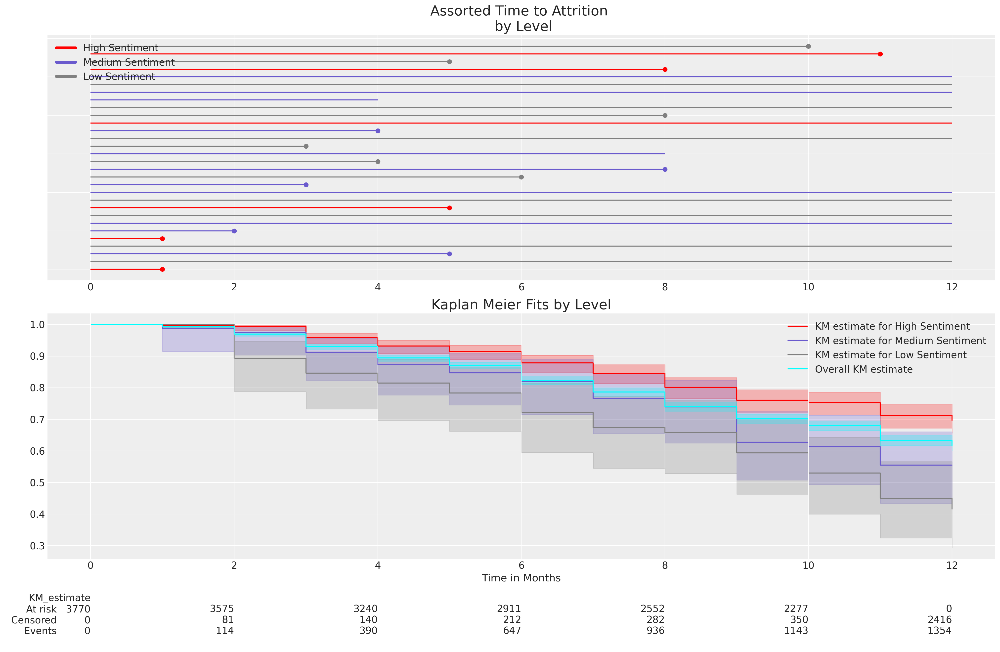

In [136]:
from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()
kmf.fit(retention_df['month'], event_observed=retention_df['left'])
kmf_hi = KaplanMeierFitter()
kmf_hi.fit(retention_df[retention_df['sentiment']==10]['month'], event_observed=retention_df[retention_df['sentiment']==10]['left'])
kmf_mid = KaplanMeierFitter()
kmf_mid.fit(retention_df[retention_df['sentiment']==5]['month'], event_observed=retention_df[retention_df['sentiment']==5]['left'])
kmf_low = KaplanMeierFitter()
kmf_low.fit(retention_df[retention_df['sentiment']==2]['month'], event_observed=retention_df[retention_df['sentiment']==2]['left'])

fig, axs = plt.subplots(2,1, figsize=(20, 13))
axs = axs.flatten()
ax = axs[0]
for i in retention_df.index.unique()[0:30]:
    temp = retention_df[retention_df.index == i]
    event = temp['left'].max() == 1
    level = temp['level'].unique()
    duration = temp['month'].max()
    color = np.where(level == 'High', 'red', np.where(level == 'Medium', 'slateblue', 'grey'))
    ax.hlines(i, 0, duration, color=color)
    if event: 
        ax.scatter(duration, i, color=color)
ax.set_title("Assorted Time to Attrition \n by Level", fontsize=20)
ax.set_yticklabels([])
from matplotlib.lines import Line2D

custom_lines = [Line2D([0], [0], color='red', lw=4),
                Line2D([0], [0], color='slateblue', lw=4),
                Line2D([0], [0], color='grey', lw=4)]

ax.legend(custom_lines, ['High Sentiment', 'Medium Sentiment', 'Low Sentiment'])


kmf_hi.plot_survival_function(ax=axs[1], label='KM estimate for High Sentiment', color='red')
kmf_mid.plot_survival_function(ax=axs[1], label='KM estimate for Medium Sentiment', color='slateblue')
kmf_low.plot_survival_function(ax=axs[1], label='KM estimate for Low Sentiment', color='grey')
kmf.plot_survival_function(ax=axs[1], label='Overall KM estimate', color='cyan', at_risk_counts=True)
axs[1].set_xlabel("Time in Months")
axs[1].set_title("Kaplan Meier Fits by Level", fontsize=20);
    
    

Here we've used the Kaplan Meier non-parametric estimate of the survival curve within levels of the `sentiment` variable to show how the anticipated levels of attrition over a 12 month period are modified by the levels of `sentiment` expressed by the participants at the outset of the trial period. This is akin to exploratory data analysis of the survival curves. 

## Data Preperation for Survival Regression

The idea behind Cox Proportional Hazard regression models is, put crudely, to treat the temporal component of risk seriously. We imagine a latent baseline hazard of occurence over the time-interval. This term is often denoted:

$$ \lambda_{0}(t)$$

It is combined multiplicatively in the Cox Regression: 

$$ \lambda_{0}(t) \cdot e^{\beta_{1}X_{1} + \beta_{2}X_{2}... \beta_{k}X_{k}} $$

and represents the baseline hazard at each point in time when the predictor variables are set at their baseline/reference levels. In our case we are looking at data with granularity of monthly entries. So we need to understand how the risk of attrition changes over the next 12 months subsequent to the date of the annual survey. 

These models can be estimated using the approach of Bayesian estimation outlined by Austin Rochford in {ref}`survival_analysis`


In [4]:
interval_length = 1
interval_bounds = np.arange(0, retention_df.month.max() + interval_length + 1, interval_length)
n_intervals = interval_bounds.size - 1
intervals = np.arange(n_intervals)
intervals

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

We then arrange our data into a structure to show if and when each individual in the data set experienced an event of attrition. 

In [5]:
intervals = np.arange(12)
n_employees = retention_df.shape[0]
n_intervals =len(intervals)
last_period = np.floor((retention_df.month - 0.01) / interval_length).astype(int)
employees = np.arange(n_employees)
quit = np.zeros((n_employees, n_intervals))
quit[employees, last_period] = retention_df['left']

pd.DataFrame(quit)

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3765,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3766,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3768,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


As outlined in {ref}`Reliability Statistics and Predictive Calibration` the hazard function, the cumulative density function and the survival function of a failure time distribution are all intimately related. In particular each of these can be described in relation to the set of individual at risk at any given time in the sequence. The pool of those individuals at risk changes over time as people experience events of attrition. This changes the conditional hazard ovr time. To account for this in our estimation strategy we need to configure our data to flag who is at risk and when. 

In [6]:
exposure = np.greater_equal.outer(retention_df.month.to_numpy(), interval_bounds[:-2]) * interval_length
exposure[employees, last_period] = retention_df.month - interval_bounds[last_period]
pd.DataFrame(exposure)

,0,1,2,3,4,5,6,7,8,9,10,11
0,1,1,0,0,0,0,0,0,0,0,0,0
1,1,1,1,1,1,1,1,1,1,1,1,1
2,1,1,1,1,1,1,0,0,0,0,0,0
3,1,1,1,1,1,1,1,1,1,1,1,1
4,1,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3765,1,1,1,1,1,1,1,1,1,1,1,1
3766,1,1,1,1,1,1,1,1,1,0,0,0
3767,1,1,1,1,1,1,1,1,1,0,0,0
3768,1,1,1,1,1,1,1,1,1,1,1,1


With these structures we are now in a position to estimate our our model. We again use the Poisson trick to estimate the Proportional hazard model. The trick is to see that Poisson regression for event counts and CoxPH regression are linked through the parameters which determine the event-rate. In the case of predicting counts we need a latent risk of a event indexed to time by an offset for each time-interval. This ensures that the likelihood term for a kind of Poisson regression is similar enough to the likelihodd under consideration in the CoxPH regression that we can substitute one for the other. 

## Fit Basic Cox Model with Fixed Effects

We'll set up a model factory function to fit the basic Cox proportional hazards model with different covariate specifications. We want to assess the differences in the model implications between a model that measures the intention to quit and one that does not. 

In [125]:

preds = ['sentiment', 'Male', 'Low', 'Medium', 'Finance', 'Health', 'Law', 'Public/Government', 'Sales/Marketing']
preds2 = ['sentiment', 'intention', 'Male', 'Low', 'Medium', 'Finance', 'Health', 'Law', 'Public/Government', 'Sales/Marketing']

def make_coxph(preds):
    coords = {"intervals": intervals, 'preds': preds}

    with pm.Model(coords=coords) as base_model:
        X_data = pm.MutableData('X_data_obs', retention_df[preds])
        lambda0 = pm.Gamma("lambda0", 0.01, 0.01, dims="intervals")

        beta = pm.Normal("beta", 0, sigma=1, dims ='preds')
        lambda_ = pm.Deterministic("lambda_", pt.outer(pt.exp( pm.math.dot(beta, X_data.T)), lambda0))
    
        mu = pm.Deterministic("mu", exposure*lambda_)

        obs = pm.Poisson("obs", mu, observed=quit)
        base_idata = pm.sample_prior_predictive()
        base_idata.extend(pm.sample(idata_kwargs={"log_likelihood": True}))
    
    return base_idata, base_model
    
base_idata, base_model = make_coxph(preds)
base_intention_idata, base_intention_model = make_coxph(preds2)

Sampling: [beta, lambda0, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 47 seconds.
Sampling: [beta, lambda0, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 57 seconds.


In [127]:
compare = az.compare({'sentiment': base_idata, 'intention': base_intention_idata}, ic='waic')
compare

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
intention,0,-5585.739602,20.993678,0.000000,0.995811,115.897945,0.00000,False,log
sentiment,1,-5680.376137,19.907278,94.636536,0.004189,117.577259,14.20486,False,log


We can see here how the structure of the model, while slightly different from a typical regression model, incorporates all the same elements. The observed variables are combined in a weighted sum that is fed forward to modify the outcome(s). In our case the outcomes are the hazards - or conditional risk at a specific point in time. It is this collection of estimates that serve as our view of the evolving nature of risk in the period. An obvious question then is how do the predictive variables contribute to the evolution of risk.

A secondary question is how does the instance by instance view of hazard translate into a view of the probability of survival over time?

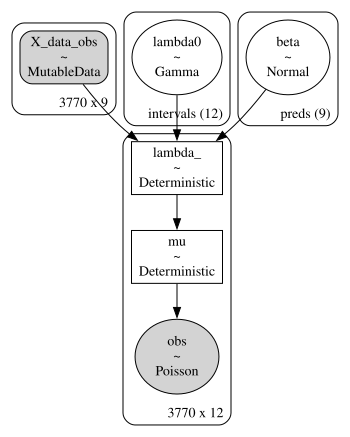

In [36]:
pm.model_to_graphviz(base_model)

### Interpreting the Model Coefficients

We'll focus first on the differential implications for the input variables in our two models. The beta parameter estimates are recorded on the scale of the log hazard rate. See first how the `intention` predictor (a score measuring the survey participant's intention to quit) shifts the magnitude and sign of the parameter estimates achieved in the model which failed to include this variable. This is a simple but poignant reminder to ensure that we measure the right thing, and that the features/variables which go into our model compose a story about the data generating process whether we pay attention or not. 

In [37]:
m = az.summary(base_idata, var_names=['beta']).reset_index()[['index', 'mean']].rename({'mean': 'expected_hr'}, axis=1)
m1 = az.summary(base_intention_idata, var_names=['beta']).reset_index()[['index', 'mean']].rename({'mean': 'expected_intention_hr'}, axis=1)
m = m.merge(m1, left_on='index', right_on='index', how='outer')
m['exp(expected_hr)'] = np.exp(m['expected_hr'])
m['exp(expected_intention_hr)'] = np.exp(m['expected_intention_hr'])
m


,index,expected_hr,expected_intention_hr,exp(expected_hr),exp(expected_intention_hr)
0,beta[sentiment],-0.110,-0.029,0.895834,0.971416
1,beta[Male],-0.038,0.014,0.962713,1.014098
2,beta[Low],0.134,0.151,1.143393,1.162997
3,beta[Medium],0.157,0.103,1.169996,1.108491
4,beta[Finance],0.207,0.235,1.229983,1.264909
5,beta[Health],0.252,0.239,1.286596,1.269979
6,beta[Law],0.098,0.074,1.102963,1.076807
7,beta[Public/Government],0.101,0.119,1.106277,1.126370
8,beta[Sales/Marketing],0.078,0.100,1.081123,1.105171
9,beta[intention],NaN,0.189,NaN,1.208041


Each individual model coefficient records an estimate of the impact on the log hazard ratio entailed by a unit increase in the input variable. Note how we have exponentiated the coefficients to return them to scale of the hazard ratio. For a predictor variable $X$ with coefficient $\beta$, the interpretation is as follows:

- If $exp(\beta)$ > 1: An increase in X is associated with an increased hazard (risk) of the event occurring.
- If $exp(\beta)$ < 1: An increase in X is associated with a decreased hazard (lower risk) of the event occurring.
- If $exp(\beta)$ = 1: X has no effect on the hazard rate.

So our case we can see that having an occuptation in  the fields of Finance or Health would seem to induce a roughly 25% increase in the hazard risk of the event occuring over the baseline hazard. Interestingly we can see that the inclusion of the `intention` predictor seems to be important as a unit increase intention moves the dial similarly - and intention is a 0-10 scale. 

These are not time-varying - they enter __once__ into the weighted sum that modifies the baseline hazard. The CoxPH model is popular because it allows us to estimate a changing hazard at each time-point (non-parametrically) and incorporates the impact of the demographic predictors multiplicatively across the period. 

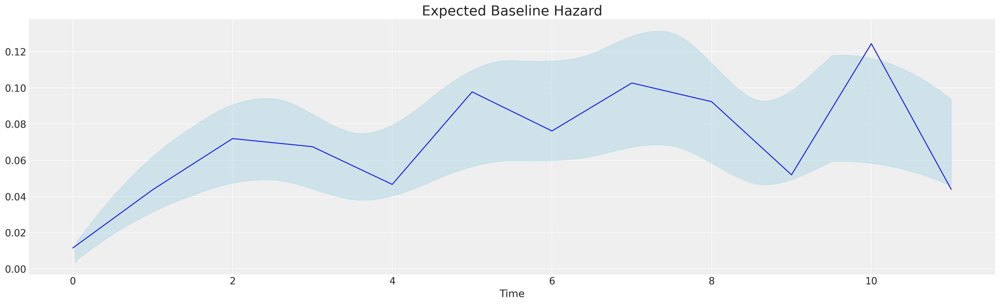

In [38]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(base_idata['posterior']['lambda0'].mean(('draw', 'chain')))
az.plot_hdi(range(12), base_idata['posterior']['lambda0'], color='lightblue', ax=ax, fill_kwargs={"label": "Baseline Survival"})
ax.set_xlabel("Time")
ax.set_title("Expected Baseline Hazard", fontsize=20);

### Predicting Marginal Effects of CoxPH regression

We can make these interpretations a little more concrete by deriving the marginal effects on sample/fictional data. First we define the relationship between the survival and cumulative hazard measures as a function of the baseline hazard. 

In [68]:
def cum_hazard(hazard):
    return hazard.cumsum(dim='intervals')


def survival(hazard):
    return np.exp(-cum_hazard(hazard))


def get_mean(trace):
    return trace.mean(("draw", "chain"))

Next we set up a function to derive the survival and cumulative hazard functions for each individual. 

In [66]:
def extract_individual_hazard(idata, i, retention_df, intention=False):
    beta = idata.posterior['beta']
    if intention: 
        intention_posterior = beta.sel(preds='intention')
    else:
        intention_posterior = 0
    hazard_base_m1 = idata['posterior']['lambda0']
  
    full_hazard_idata = hazard_base_m1 * np.exp(
                                        beta.sel(preds='sentiment')*retention_df.iloc[i]['sentiment'] + 
                                        np.where(intention, intention_posterior*retention_df.iloc[i]['intention'], 0) +
                                        beta.sel(preds='Male')*retention_df.iloc[i]['Male'] +
                                        beta.sel(preds='Low')*retention_df.iloc[i]['Low'] +  
                                        beta.sel(preds='Medium')*retention_df.iloc[i]['Medium'] +
                                        beta.sel(preds='Finance')*retention_df.iloc[i]['Finance'] +
                                        beta.sel(preds='Health')*retention_df.iloc[i]['Health'] +
                                        beta.sel(preds='Law')*retention_df.iloc[i]['Law'] +
                                        beta.sel(preds='Public/Government')*retention_df.iloc[i]['Public/Government'] +
                                        beta.sel(preds='Sales/Marketing')*retention_df.iloc[i]['Sales/Marketing'] 
                                        )

    cum_haz_idata = cum_hazard(full_hazard_idata)
    survival_idata = survival(full_hazard_idata)
    return full_hazard_idata, cum_haz_idata, survival_idata, hazard_base_m1


def plot_individuals(retention_df, idata, individuals=[1, 300, 700], intention=False): 
    fig, axs = plt.subplots(1, 2, figsize=(20, 7))
    axs = axs.flatten()
    for i in individuals:
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_hazard(idata, i, retention_df, intention)
        axs[0].plot(get_mean(survival_idata), label=f'individual_{i}')
        az.plot_hdi(range(12),survival_idata, ax=axs[0], fill_kwargs={'color': 'slateblue'})
        axs[1].plot(get_mean(cum_haz_idata), label=f'individual_{i}')
        az.plot_hdi(range(12),cum_haz_idata, ax=axs[1], fill_kwargs={'color': 'grey'})
        axs[0].set_title("Individual Survival Functions", fontsize=15)
        axs[1].set_title("Individual Cumulative Hazard Functions", fontsize=15)
    az.plot_hdi(range(12), survival(base_hazard), color='lightblue', ax=axs[0], fill_kwargs={"label": "Baseline Survival"})
    axs[0].plot(get_mean(survival(base_hazard)), color='black', linestyle='--', label='Expected Baseline Survival')
    az.plot_hdi(range(12), cum_hazard(base_hazard), color='lightblue', ax=axs[1], fill_kwargs={"label": "Baseline Hazard"})
    axs[1].plot(get_mean(cum_hazard(base_hazard)), color='black', linestyle='--', label='Expected Baseline Hazard')
    axs[0].legend()
    axs[0].set_ylabel("Probability of Survival")
    axs[1].set_ylabel("Cumulative Hazard Risk")
    axs[0].set_xlabel("Time")
    axs[1].set_xlabel("Time")
    axs[1].legend()

#### Next set up test-data input to explore the relationship between levels of the variables. 
test_df = pd.DataFrame(np.zeros((3, 15)), columns=retention_df.columns)
test_df['sentiment'] = [1, 5, 10]
test_df['intention'] = [1, 5, 10]
test_df['Medium'] = [0, 0, 0]
test_df['Finance'] = [0, 0, 0]
test_df['M'] = [1, 1, 1]
test_df

,gender,field,level,sentiment,intention,left,month,Male,Low,Medium,Finance,Health,Law,Public/Government,Sales/Marketing,M
0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,0.0,5,5,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,0.0,10,10,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,1


### The Intention Model

If we plot the marginal effects increases in the `intention` variable in the model equiped to evaluate it, we see a sharp seperation in the individual predicted survival curves as implied by the significant and substantial parameter estimate. 

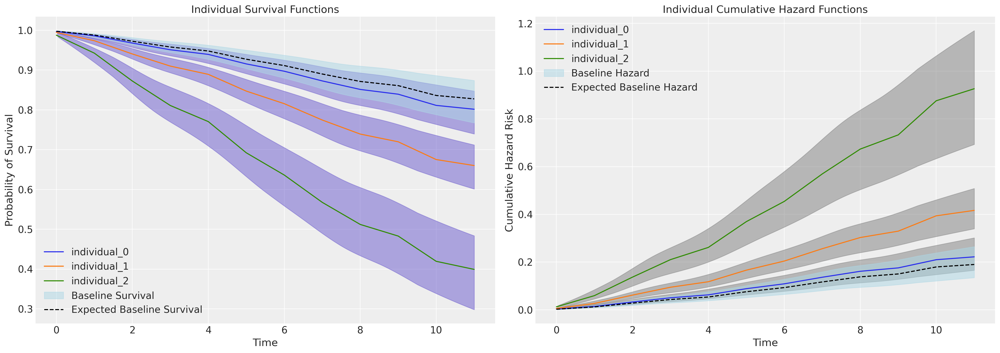

In [885]:
plot_individuals(test_df, base_intention_idata, [0, 1, 2], intention=True)

Focus here on the plot on the right. The baseline cumulative hazard is represented in blue, where each subsequent curve represents the cumulative hazard for individuals with increasing scores on the `intention` metric i.e. with increased hazard. This pattern is inverted on the plot on the left - where instead we see how probability of survival decreases over time more sharply for those individuals which high `intention` values.

### The Sentiment Model

If we submit the same test to a model unable to account for intention most of the weight falls on the differences specified between the sentiment recorded by the survey participant. Here we also see a seperation in the survival curves, but the effect is much less pronounced. 

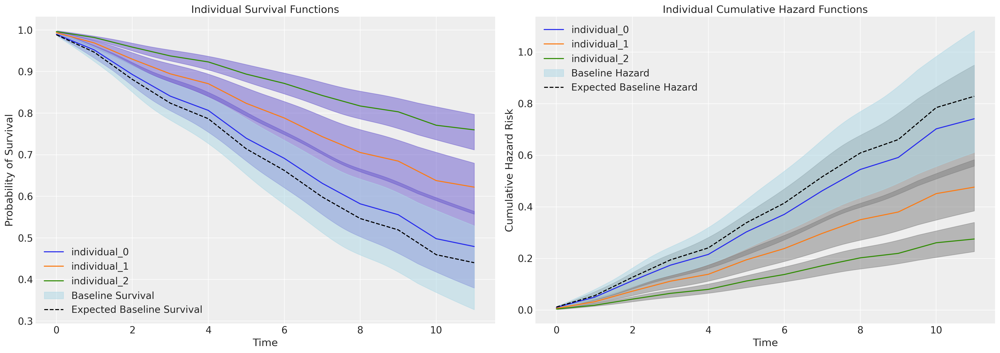

In [886]:
plot_individuals(test_df, base_idata, [0, 1, 2], intention=False)

Other combinations of test-data and input specifications can be used to experiment with the conditional implications of the CoxPh model in this way. 

### Make Predictions for Individual Characteristics

It's all well and good to use marginal effects analysis to better understand the impact of particular variables, but how we can use it to predict the likely trajectories within our pool of polled employees? Here we simply re-apply the model to our observed data set where each participant is characterised in some sense by the observable inputs of our model. 

We can use these characteristics to predict the survival curves of our current or future employee base and make interventions where necessary to mitigate the implied risk of attrition for these and similar employee profiles.  


In [69]:
def create_predictions(retention_df, idata):
    cum_haz = {}
    surv = {}
    for i in range(len(retention_df)):
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_hazard(idata, i, retention_df)
        cum_haz[i] = get_mean(cum_haz_idata)
        surv[i] = get_mean(survival_idata)
    cum_haz = pd.DataFrame(cum_haz)
    surv = pd.DataFrame(surv)
    return cum_haz, surv

cum_haz_df, surv_df = create_predictions(retention_df, base_idata)
surv_df

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,0.991145,0.993274,0.993985,0.993525,0.993663,0.990989,0.994608,0.992779,0.994288,0.993471,...,0.993626,0.995493,0.990585,0.992779,0.993193,0.995225,0.992779,0.989973,0.995882,0.994165
1,0.958575,0.968384,0.971687,0.969557,0.970212,0.957810,0.974589,0.966094,0.973125,0.969319,...,0.970048,0.978726,0.955990,0.966094,0.968008,0.977494,0.966094,0.953163,0.980569,0.972537
2,0.907340,0.928795,0.936100,0.931382,0.932841,0.905696,0.942539,0.923750,0.939294,0.930875,...,0.932479,0.951764,0.901741,0.923750,0.927982,0.949017,0.923750,0.895577,0.955892,0.937978
3,0.861814,0.893145,0.903915,0.896953,0.899115,0.859440,0.913445,0.885732,0.908650,0.896226,...,0.898582,0.927159,0.853693,0.885732,0.891972,0.923074,0.885732,0.844747,0.933324,0.906693
4,0.831684,0.869284,0.882299,0.873881,0.876498,0.828851,0.893842,0.860350,0.888041,0.873028,...,0.875864,0.910507,0.821983,0.860350,0.867890,0.905547,0.860350,0.811290,0.918024,0.885666
5,0.772027,0.821392,0.838723,0.827498,0.831004,0.768362,0.854174,0.809559,0.846421,0.826425,...,0.830146,0.876627,0.759398,0.809559,0.819588,0.869925,0.809559,0.745500,0.886819,0.843223
6,0.728560,0.785918,0.806278,0.793075,0.797210,0.724369,0.824500,0.772076,0.815361,0.791882,...,0.796202,0.851116,0.713998,0.772076,0.783858,0.843158,0.772076,0.697971,0.863252,0.811576
7,0.673900,0.740556,0.764551,0.748968,0.753863,0.669137,0.786152,0.724322,0.775333,0.747661,...,0.752676,0.817927,0.657155,0.724322,0.738216,0.808414,0.724322,0.638723,0.832503,0.770828
8,0.628288,0.701986,0.728865,0.711383,0.716892,0.623108,0.753182,0.683887,0.741019,0.710022,...,0.715571,0.789178,0.609945,0.683887,0.699449,0.778392,0.683887,0.589741,0.805786,0.735926
9,0.603995,0.681160,0.709517,0.691055,0.696885,0.598630,0.735237,0.662119,0.722379,0.689680,...,0.695490,0.773448,0.584890,0.662119,0.678538,0.761985,0.662119,0.563835,0.791127,0.716974


### Sample Survival Curves and their Marginal Expected Survival Trajectory.

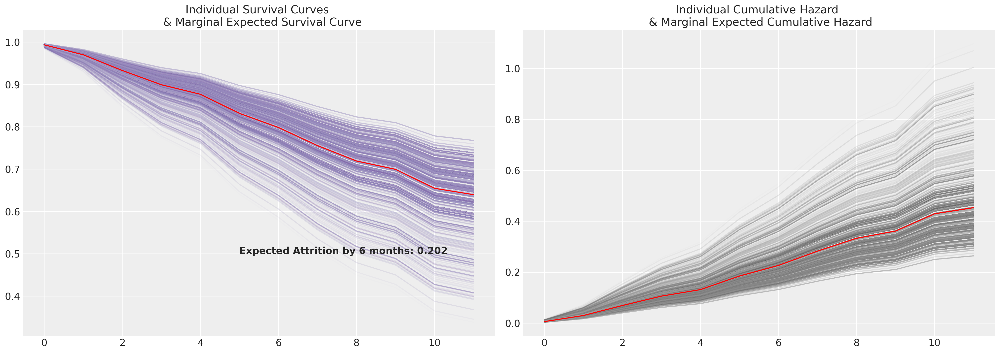

In [895]:
cm_subsection = np.linspace(0, 1, 120) 
colors_m = [cm.Purples(x) for x in cm_subsection]
colors = [cm.Greys(x) for x in cm_subsection]


fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs = axs.flatten()
cum_haz_df.plot(legend=False, color=colors, alpha=0.05, ax=axs[1])
axs[1].plot(cum_haz_df.mean(axis=1), color='red')
axs[1].set_title("Individual Cumulative Hazard \n & Marginal Expected Cumulative Hazard")

surv_df.plot(legend=False, color=colors_m, alpha=0.05, ax=axs[0])
axs[0].plot(surv_df.mean(axis=1), color='red');
axs[0].set_title("Individual Survival Curves \n  & Marginal Expected Survival Curve");
axs[0].annotate(f'Expected Attrition by 6 months: {np.round(1-surv_df.mean(axis=1).iloc[6], 3)}', (5, 0.5), 
                fontsize=14, fontweight='bold');

The marginal survival curve here is a summary statistic just like measuring the average in simpler cases. It is characteristic of your sample data (the individuals in your sample), and as such you should only take it as an indicative or generalisable measure in so far as you're happy to say that your sample data is proportionally representative of the different characteristic features of risk in your population. Survival __modelling__ is not a substitute for sound experimental design, but it can be used to analyse experimental data.

## Accelerated Failure Time Models

Next we examine a parametric failure of regression based survival models called accelerated failure time models (AFTs). These are regression models that seek to describe the survival function of interest with appeal to one or other of the canonical statistical distributions that can be neatly characterised with a set of location and scale parameters e.g. the Weilbull distribution, the Log-Logistic distribution and the LogNormal distribution to name a few. One advantage of these family of distributions is that we have access to more flexible hazard functions: 

See here for example how the log-logistic distribution exhibits a non-monotonic hazard function whereas the Weibull hazard is necessarily monotonic. 


/Users/nathanielforde/mambaforge/envs/pymc_examples_new/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:1013: RuntimeWarning: divide by zero encountered in power
  lambda x_, c_, d_: c_ * d_ * (x_**(c_*d_-1)) / (1 + x_**c_),


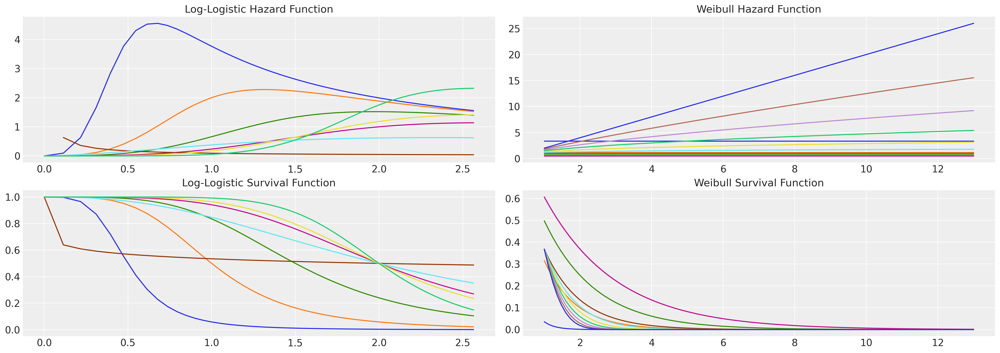

In [128]:
fig, axs = plt.subplots(2, 2, figsize=(20, 7))
axs = axs.flatten()
def make_loglog_haz(alpha, beta):
    ## This is the Log Logistic distribution
    dist = fisk(c=alpha, scale=beta)
    t = np.log(np.linspace(1, 13, 100))  # Time values
    pdf_values = dist.pdf(t)
    sf_values = dist.sf(t)
    haz_values = pdf_values / sf_values
    axs[0].plot(t, haz_values);
    axs[2].plot(t, sf_values)


def make_weibull_haz(alpha, beta):
    dist = weibull_min(c=alpha, scale=beta)
    t = np.linspace(1, 13, 100)  # Time values
    pdf_values = dist.pdf(t)
    sf_values = dist.sf(t)
    haz_values = pdf_values / sf_values
    axs[1].plot(t, haz_values);
    axs[3].plot(t, sf_values);

[make_loglog_haz(4, b) for b in np.linspace(.5, 2, 4)]
[make_loglog_haz(a, 2) for a in np.linspace(.2, 7, 4)]
[make_weibull_haz(1, a) for a in np.linspace(0.3, 2, 4)]
[make_weibull_haz(b, 1) for b in np.linspace(1, 2, 7)]
axs[0].set_title("Log-Logistic Hazard Function", fontsize=15)
axs[2].set_title("Log-Logistic Survival Function", fontsize=15)
axs[1].set_title("Weibull Hazard Function", fontsize=15);
axs[3].set_title("Weibull Survival Function", fontsize=15);




AFT models incorporate the explanatory variables in a regression model so that they act multiplicatively on the time scale effecting the rate at which an individual proceeds along the time axis. As such the model can be interpreted directly as parameterised by the speed of progression towards the event of interest. The Survival function of AFT models are generally specified as: 

$$ S_{i}(t) = S_{0}(\frac{t}{exp(\alpha_{i}x_{i} + \alpha_{2}x_{2} ... \alpha_{p}x_{p})}) $$

where $S_{0}$ is the baseline survival, but the model is often represented in log-linear form: 

$$ log T_{i} = \mu + \alpha_{i}x_{i} + \alpha_{2}x_{2} ... \alpha_{p}x_{p} + \sigma\epsilon_{i} $$

where we have $S_{0} = P(exp(\mu + \sigma\epsilon_{i}) \geq t)$

Below we'll estimate two AFT models: the weibull model and the Log-Logistic model. In the case of the Log-Logistic model we estimate it by transforming our time variable to a log-scale and fitting a logistic likelihood. The resulting parameter fits can be adapted to recover the log-logistic survival function as we'll show below. 

In [129]:
coords = {"intervals": intervals, 
          'preds': ['sentiment','Male', 'Low', 'Medium', 
                    'Finance', 'Health', 'Law', 'Public/Government', 'Sales/Marketing']}

X = retention_df[['sentiment','Male', 'Low', 'Medium', 
                    'Finance', 'Health', 'Law', 'Public/Government', 'Sales/Marketing']]
y = retention_df['month'].values
cens = retention_df.left.values == 0.0


def logistic_sf(y, μ, s):
    return 1.0 - pm.math.sigmoid((y - μ) / s)

def weibull_lccdf(x, alpha, beta):
    """Log complementary cdf of Weibull distribution."""
    return -((x / beta) ** alpha)


def make_aft(y, weibull=True):
    with pm.Model(coords=coords, check_bounds=False) as aft_model:
        X_data = pm.MutableData('X_data_obs', X)
        beta = pm.Normal("beta", 0.0, 1, dims='preds')
        mu = pm.Normal('mu', 0, 1)

        if weibull:
            s = pm.HalfNormal('s', 5.)
            eta = pm.Deterministic('eta', pm.math.dot(beta, X_data.T))
            reg = pm.Deterministic('reg', pt.exp(-( (mu + eta)) / s))
            y_obs = pm.Weibull("y_obs", beta=reg[~cens], alpha=s, observed=y[~cens])
            y_cens = pm.Potential("y_cens", weibull_lccdf(y[cens], alpha=s, beta=reg[cens]))
        else: 
            s = pm.HalfNormal('s', 5.)
            eta = pm.Deterministic('eta', pm.math.dot(beta, X_data.T))
            reg = pm.Deterministic('reg', mu + eta)
            y_obs = pm.Logistic("y_obs", reg[~cens], s, observed=y[~cens])
            y_cens = pm.Potential("y_cens", logistic_sf(y[cens], reg[cens], s))

        idata = pm.sample(target_accept=0.95, idata_kwargs={"log_likelihood": True})
        idata.extend(pm.sample_posterior_predictive(idata))
    return idata, aft_model


weibull_idata, weibull_aft = make_aft(y)
loglogistic_idata, loglogistic_aft = make_aft(np.log(y), weibull=False)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, mu, s]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 77 seconds.
/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_10958/445141468.py:39: UserWarning: The effect of Potentials on other parameters is ignored during posterior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  idata.extend(pm.sample_posterior_predictive(idata))
Sampling: [y_obs]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, mu, s]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 56 seconds.
/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_10958/445141468.py:39: UserWarning: The effect of Potentials on other parameters is ignored during posterior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  idata.extend(pm.sample_posterior_predictive(idata))
Sampling: [y_obs]


### Deriving Individual Survival Predictions from AFT models

From above we can see that the 

### Weibull

In [62]:
reg = az.summary(weibull_idata, var_names=['reg'])['mean']
s = az.summary(weibull_idata, var_names=['s'])['mean'][0]
t = np.arange(1, 13, 1)
#### Using the fact that we've already stored expected value
weibull_predicted_surv = pd.DataFrame([weibull_min.sf(t, s, scale=reg.iloc[i]) 
                                       for i in range(len(reg))]).T

weibull_predicted_surv

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,0.987498,0.991023,0.991974,0.991523,0.991513,0.987648,0.992912,0.990401,0.992382,0.991613,...,0.991649,0.994150,0.986811,0.990401,0.991147,0.993911,0.990401,0.986081,0.994757,0.992389
1,0.961521,0.972267,0.975181,0.973797,0.973769,0.961977,0.978060,0.970366,0.976432,0.974074,...,0.974183,0.981867,0.959439,0.970366,0.972647,0.981132,0.970366,0.957225,0.983737,0.976452
2,0.926513,0.946761,0.952289,0.949662,0.949609,0.927368,0.957765,0.943163,0.954667,0.950186,...,0.950394,0.965030,0.922613,0.943163,0.947481,0.963625,0.943163,0.918478,0.968609,0.954704
3,0.884814,0.916020,0.924612,0.920524,0.920442,0.886124,0.933151,0.910445,0.928316,0.921340,...,0.921663,0.944525,0.878850,0.910445,0.917138,0.942322,0.910445,0.872543,0.950148,0.928374
4,0.838203,0.881169,0.893113,0.887424,0.887310,0.839993,0.905033,0.873445,0.898278,0.888558,...,0.889007,0.920986,0.830067,0.873445,0.882720,0.917888,0.873445,0.821489,0.928903,0.898359
5,0.788164,0.843136,0.858587,0.851219,0.851071,0.790434,0.874079,0.833183,0.865291,0.852687,...,0.853267,0.894923,0.777862,0.833183,0.845138,0.890866,0.833183,0.767040,0.905315,0.865396
6,0.735968,0.802728,0.821722,0.812652,0.812470,0.738700,0.840866,0.790545,0.829994,0.814457,...,0.815172,0.866778,0.723604,0.790545,0.805184,0.861721,0.790545,0.710664,0.879762,0.830124
7,0.682718,0.760657,0.783130,0.772383,0.772168,0.685874,0.805909,0.746312,0.792957,0.774519,...,0.775365,0.836943,0.668468,0.746312,0.763555,0.830868,0.746312,0.653618,0.852580,0.793112
8,0.629358,0.717555,0.743355,0.730997,0.730750,0.632889,0.769668,0.701171,0.754687,0.733451,...,0.734423,0.805773,0.613456,0.701171,0.720874,0.798683,0.701171,0.596962,0.824074,0.754866
9,0.576688,0.673983,0.702887,0.689018,0.688741,0.580537,0.732562,0.655728,0.715643,0.691769,...,0.692859,0.773590,0.559408,0.655728,0.677690,0.765505,0.655728,0.541575,0.794521,0.715845


### Log Logistic

In [63]:
reg = az.summary(loglogistic_idata, var_names=['reg'])['mean']
s = az.summary(loglogistic_idata, var_names=['s'])['mean'][0]
temp = retention_df
t = np.log(np.arange(1, 13, 1))
alpha = 1 / s
beta = np.exp(reg / alpha)
loglogistic_predicted_surv = pd.DataFrame([ fisk.sf(t, c=alpha, scale=beta.iloc[i]) for i in range(len(reg))]).T
loglogistic_predicted_surv


,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.940070,0.956427,0.960028,0.956386,0.956135,0.938242,0.963763,0.951927,0.959292,0.956511,...,0.955840,0.970223,0.939674,0.951927,0.950111,0.967067,0.951927,0.935943,0.969639,0.959487
2,0.848146,0.886566,0.895307,0.886465,0.885860,0.843978,0.904489,0.875788,0.893512,0.886767,...,0.885150,0.920644,0.847242,0.875788,0.871482,0.912706,0.875788,0.838773,0.919171,0.893987
3,0.768282,0.822684,0.835434,0.822538,0.821660,0.762536,0.848982,0.807156,0.832805,0.822975,...,0.820632,0.873209,0.767034,0.807156,0.801013,0.861241,0.807156,0.755402,0.870978,0.833500
4,0.703494,0.768524,0.784146,0.768346,0.767276,0.696776,0.800910,0.749696,0.780913,0.768879,...,0.766024,0.831317,0.702032,0.749696,0.742307,0.816227,0.749696,0.688474,0.828494,0.781767
5,0.650987,0.722998,0.740656,0.722798,0.721594,0.643682,0.759763,0.701904,0.736990,0.723398,...,0.720185,0.794845,0.649395,0.701904,0.693680,0.777366,0.701904,0.634688,0.791564,0.737958
6,0.607862,0.684457,0.703565,0.684241,0.682944,0.600208,0.724388,0.661801,0.699587,0.684889,...,0.681426,0.763024,0.606192,0.661801,0.653018,0.743708,0.661801,0.590814,0.759389,0.700637
7,0.571879,0.651473,0.671620,0.651246,0.649882,0.564027,0.693710,0.627737,0.667416,0.651927,...,0.648288,0.735074,0.570164,0.627737,0.618579,0.714333,0.627737,0.554414,0.731161,0.668525
8,0.541402,0.622927,0.643821,0.622692,0.621281,0.533447,0.666854,0.598445,0.639453,0.623396,...,0.619633,0.710330,0.539664,0.598445,0.589038,0.688473,0.598445,0.523729,0.706198,0.640604
9,0.515238,0.597960,0.619393,0.597720,0.596276,0.507243,0.643129,0.572968,0.614904,0.598441,...,0.594590,0.688255,0.513490,0.572968,0.563400,0.665516,0.572968,0.497493,0.683947,0.616087


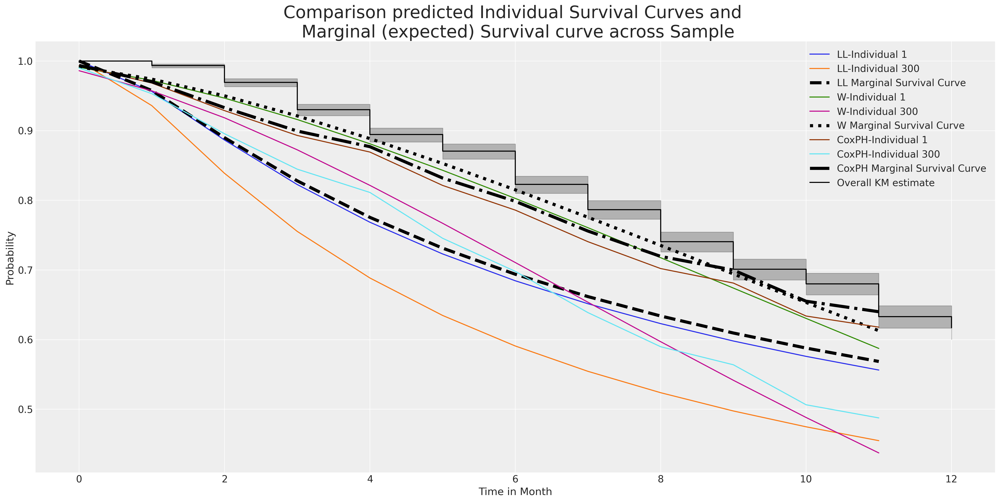

In [138]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(loglogistic_predicted_surv.iloc[:, [1, 300]], label = ['LL-Individual 1', 'LL-Individual 300'])
ax.plot(loglogistic_predicted_surv.mean(axis=1), label = 'LL Marginal Survival Curve', linestyle='--', color='black',  linewidth=4.5)
ax.plot(weibull_predicted_surv.iloc[:, [1, 300]], label = ['W-Individual 1', 'W-Individual 300'])
ax.plot(weibull_predicted_surv.mean(axis=1), label = 'W Marginal Survival Curve', linestyle='dotted', color='black', linewidth=4.5)
ax.plot(surv_df.iloc[:, [1, 300]], label = ['CoxPH-Individual 1', 'CoxPH-Individual 300'])
ax.plot(surv_df.mean(axis=1), label = 'CoxPH Marginal Survival Curve', linestyle='-.', color='black', linewidth=4.5)
ax.set_title("Comparison predicted Individual Survival Curves and \n Marginal (expected) Survival curve across Sample", fontsize=25)
kmf.plot_survival_function(ax=ax, label='Overall KM estimate', color='black')
ax.set_xlabel("Time in Month")
ax.set_ylabel("Probability")
ax.legend();

## Fit Model with Shared Frailty terms by Individual

One of the most compelling patterns in bayesian regression modelling more generally is the ability to incorporate hierarchical structure. The analogue of the hierarchical survival model is the individual frailty survival model. But "frailities" do not need to be specified only at an individual level - so called "shared" frailities can be deployed at a group level e.g. across the `field`. 

In the above CoxPH models we fit the data to a standard regression formulation using indicator variables for different levels of the `field` variable which gets included in the weighted sum of the linear combination. With frailty models we instead allow the individual or group frailty term to enter into our model as a multiplicative factor over and above the combination of the baseline hazard with the weighted demographic characteristics of risk. This allows us to capture an estimate of the heterogenous effects accruing to being that particular individual or within that particular group. So our equation now becomes:

$$ \lambda_{i}(t) = z_{i}exp(\beta X)\lambda_{0}(t) $$

which can be estimated in the Bayesian fashion as follows:

In [55]:
preds = ['sentiment', 'intention', 'Male', 'Low', 'Medium', 'Finance', 'Health', 'Law', 'Public/Government', 'Sales/Marketing']
preds3 = ['sentiment', 'intention', 'Male', 'Low', 'Medium']

def make_coxph_frailty(preds, factor):
    frailty_idx, frailty_labels = pd.factorize(factor)
    coords = {"intervals": intervals, 
          'preds': preds, 
          "frailty_id": frailty_labels}

    with pm.Model(coords=coords) as frailty_model:
        X_data = pm.MutableData('X_data_obs', retention_df[preds])
        lambda0 = pm.Gamma("lambda0", 0.01, 0.01, dims="intervals")
        frailty = pm.LogNormal('frailty', 0, 0.25, dims='frailty_id')
        
        beta = pm.Normal("beta", 0, sigma=1, dims ='preds')

        lambda_ = pm.Deterministic("lambda_", pt.outer(pt.exp(pm.math.dot(beta, X_data.T)), lambda0))
        lambda1 = pm.Deterministic('lambda1', frailty[frailty_idx, None]*lambda_)
        
        mu = pm.Deterministic("mu", exposure*lambda1)

        obs = pm.Poisson("obs", mu, observed=quit)
        frailty_idata = pm.sample_prior_predictive()
        frailty_idata.extend(pm.sample(random_seed=101))

    return frailty_idata, frailty_model
frailty_idata, frailty_model = make_coxph_frailty(preds, range(len(retention_df)))
shared_frailty_idata, shared_frailty_model = make_coxph_frailty(preds3, retention_df['field'])


Sampling: [beta, frailty, lambda0, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, frailty, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 109 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
Sampling: [beta, frailty, lambda0, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, frailty, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 87 seconds.


In [56]:
frailty_terms = az.summary(frailty_idata, var_names=['frailty'])
frailty_terms.head()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
frailty[0],1.094,0.278,0.617,1.624,0.003,0.002,11067.0,2708.0,1.0
frailty[1],0.998,0.250,0.554,1.457,0.003,0.002,10798.0,2451.0,1.0
frailty[2],1.075,0.268,0.629,1.590,0.003,0.003,11585.0,2683.0,1.0
frailty[3],1.001,0.251,0.572,1.482,0.003,0.002,13456.0,2308.0,1.0
frailty[4],1.099,0.286,0.599,1.638,0.003,0.003,9044.0,2383.0,1.0


We can now pull apart the frailty estimates and compare them to the demographic information we know about each individual.

In [141]:
temp = retention_df.copy()
temp['frailty'] = frailty_terms.reset_index()['mean']
(temp.groupby(['sentiment', 'intention'])[['frailty']].mean().reset_index().pivot(index='sentiment', columns='intention', values='frailty')
 .style.background_gradient(cmap='OrRd', axis=None).set_precision(2)
)

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_10958/676008539.py:3: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  (temp.groupby(['sentiment', 'intention'])[['frailty']].mean().reset_index().pivot(index='sentiment', columns='intention', values='frailty')


intention,1,2,3,4,5,6,7,8,9,10
sentiment,,,,,,,,,,
1,nan,1.08,1.05,nan,1.03,1.06,0.98,1.04,1.01,1.06
2,1.01,1.04,1.04,1.02,1.03,1.04,1.02,1.02,1.04,1.03
3,1.05,1.05,1.04,1.03,1.02,1.02,1.01,1.03,1.02,1.08
4,1.04,1.04,1.03,1.04,1.04,1.03,1.03,1.04,1.03,nan
5,1.01,1.04,1.03,1.04,1.03,1.03,1.02,1.03,0.97,0.96
6,1.05,1.03,1.01,1.03,1.04,1.01,1.02,1.03,1.07,1.05
7,1.03,1.04,1.03,1.03,1.03,1.04,1.03,1.02,1.03,1.04
8,1.03,1.03,1.03,1.03,1.03,1.04,1.03,1.04,1.04,1.04
9,1.03,1.04,1.03,1.03,1.03,1.02,1.02,1.03,1.05,nan


which suggests that the model under weights the impact of low sentiment and intention score and the frailty term compensates by adding a stronger multiplicative increase in the hazard term.  

## Interrogating the Cox Frailty Model


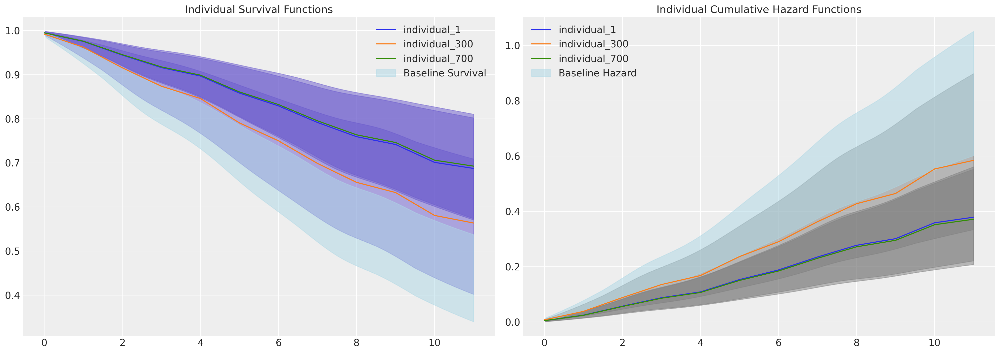

In [822]:
def extract_individual_frailty(i, retention_df):
    hazard_base = frailty_idata['posterior']['lambda0']
    beta = frailty_idata.posterior['beta']
    frailty = frailty_idata.posterior['frailty']
    full_hazard_idata = frailty.sel(frailty_id=i)*(hazard_base * np.exp( 
                                        beta.sel(preds='sentiment')*retention_df.iloc[i]['sentiment'] + 
                                        beta.sel(preds='Male')*retention_df.iloc[i]['Male'] +
                                        beta.sel(preds='Low')*retention_df.iloc[i]['Low'] +  
                                        beta.sel(preds='Medium')*retention_df.iloc[i]['Medium'] 
                                        ))

    cum_haz_idata = cum_hazard(full_hazard_idata)
    survival_idata = survival(full_hazard_idata)
    return full_hazard_idata, cum_haz_idata, survival_idata, hazard_base

def plot_individual_frailty(retention_df, individuals=[1, 300, 700]): 
    fig, axs = plt.subplots(1, 2, figsize=(20, 7))
    axs = axs.flatten()
    for i in individuals:
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_frailty(i, retention_df)
        axs[0].plot(get_mean(survival_idata), label=f'individual_{i}')
        az.plot_hdi(range(12),survival_idata, ax=axs[0], fill_kwargs={'color': 'slateblue'})
        axs[1].plot(get_mean(cum_haz_idata), label=f'individual_{i}')
        az.plot_hdi(range(12),cum_haz_idata, ax=axs[1], fill_kwargs={'color': 'grey'})
        axs[0].set_title("Individual Survival Functions", fontsize=15)
        axs[1].set_title("Individual Cumulative Hazard Functions", fontsize=15)
    az.plot_hdi(range(12), survival(base_hazard), color='lightblue', ax=axs[0], fill_kwargs={"label": "Baseline Survival"})
    az.plot_hdi(range(12), cum_hazard(base_hazard), color='lightblue', ax=axs[1], fill_kwargs={"label": "Baseline Hazard"})
    axs[0].legend()
    axs[1].legend()

plot_individual_frailty(retention_df)

In [824]:
def create_predictions(retention_df):
    cum_haz = {}
    surv = {}
    for i in range(len(retention_df)):
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_frailty(i, retention_df)
        cum_haz[i] = get_mean(cum_haz_idata)
        surv[i] = get_mean(survival_idata)
    cum_haz = pd.DataFrame(cum_haz)
    surv = pd.DataFrame(surv)
    return cum_haz, surv

cum_haz_frailty_df, surv_frailty_df = create_predictions(retention_df)
surv_frailty_df

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,0.991491,0.994750,0.993682,0.994903,0.994573,0.992622,0.994784,0.994316,0.994626,0.994315,...,0.993810,0.995644,0.991643,0.994354,0.994581,0.995739,0.993931,0.991613,0.996411,0.994905
1,0.960244,0.975296,0.970303,0.976012,0.974453,0.965344,0.975436,0.973250,0.974676,0.973236,...,0.970882,0.979413,0.960886,0.973409,0.974512,0.979869,0.971479,0.960715,0.983012,0.975968
2,0.911183,0.944224,0.933182,0.945821,0.942352,0.922314,0.944535,0.939673,0.942835,0.939630,...,0.934425,0.953404,0.912576,0.940015,0.942488,0.954431,0.935760,0.912208,0.961439,0.945681
3,0.867504,0.915959,0.899666,0.918341,0.913178,0.883730,0.916416,0.909238,0.913891,0.909161,...,0.901471,0.929604,0.869505,0.909717,0.913395,0.931127,0.903428,0.868963,0.941605,0.918119
4,0.838578,0.896907,0.877217,0.899795,0.893551,0.858004,0.897466,0.888764,0.894404,0.888670,...,0.879380,0.913486,0.840960,0.889324,0.893785,0.915340,0.881723,0.840289,0.928114,0.899520
5,0.781096,0.858203,0.831927,0.862105,0.853748,0.806502,0.858983,0.847297,0.854888,0.847200,...,0.834797,0.880568,0.784195,0.848053,0.854049,0.883083,0.837898,0.783240,0.900447,0.861721
6,0.739042,0.829152,0.798219,0.833766,0.823909,0.768467,0.830093,0.816285,0.825245,0.816167,...,0.801590,0.855687,0.742605,0.817162,0.824246,0.858680,0.805220,0.741462,0.879414,0.833314
7,0.686205,0.791608,0.755046,0.797126,0.785435,0.720201,0.792769,0.776360,0.787032,0.776245,...,0.759029,0.823325,0.690219,0.777413,0.785816,0.826920,0.763291,0.688886,0.851869,0.796590
8,0.642059,0.759348,0.718297,0.765572,0.752431,0.679502,0.760671,0.742183,0.754233,0.742058,...,0.722752,0.795275,0.646408,0.743351,0.752827,0.799375,0.727490,0.644913,0.827846,0.764963
9,0.618426,0.741699,0.698329,0.748303,0.734413,0.657545,0.743113,0.723544,0.736319,0.723411,...,0.703042,0.779848,0.622932,0.724770,0.734812,0.784204,0.708019,0.621352,0.814574,0.747651


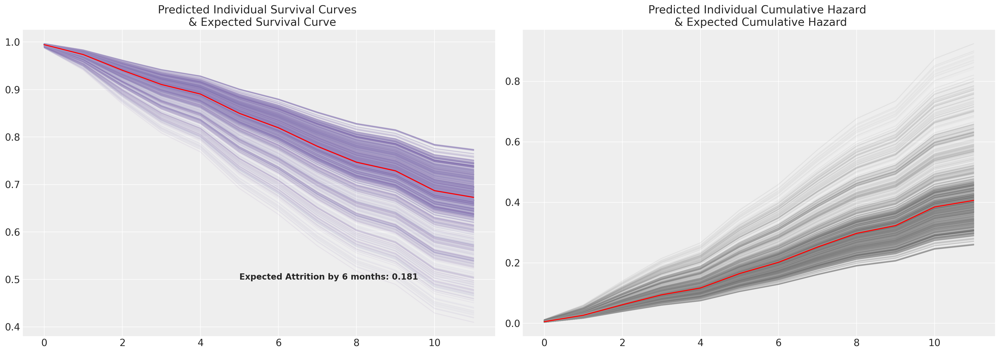

In [825]:
cm_subsection = np.linspace(0, 1, 120) 
colors_m = [cm.Purples(x) for x in cm_subsection]
colors = [cm.Greys(x) for x in cm_subsection]


fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs = axs.flatten()
cum_haz_frailty_df.plot(legend=False, color=colors, alpha=0.05, ax=axs[1])
axs[1].plot(cum_haz_frailty_df.mean(axis=1), color='red')
axs[1].set_title("Predicted Individual Cumulative Hazard \n & Expected Cumulative Hazard")

surv_frailty_df.plot(legend=False, color=colors_m, alpha=0.05, ax=axs[0])
axs[0].plot(surv_frailty_df.mean(axis=1), color='red');
axs[0].set_title("Predicted Individual Survival Curves \n  & Expected Survival Curve");
axs[0].annotate(f'Expected Attrition by 6 months: {np.round(1-surv_frailty_df.mean(axis=1).iloc[6], 3)}', (5, 0.5), 
                fontsize=12, fontweight='bold');

### Plotting the effects of the Frailty Terms

In [888]:
beta_individual = frailty_idata["posterior"]["frailty"]
beta_individual = beta_individual.sel(frailty_id=range(120))
predicted = beta_individual.mean(("chain", "draw"))
predicted = predicted.sortby(predicted)
ci_lb = beta_individual.quantile(0.025, ("chain", "draw")).sortby(predicted)
ci_ub = beta_individual.quantile(0.975, ("chain", "draw")).sortby(predicted)
hdi = az.hdi(beta_individual, hdi_prob=0.5).sortby(predicted)
hdi2 = az.hdi(beta_individual, hdi_prob=0.85).sortby(predicted)

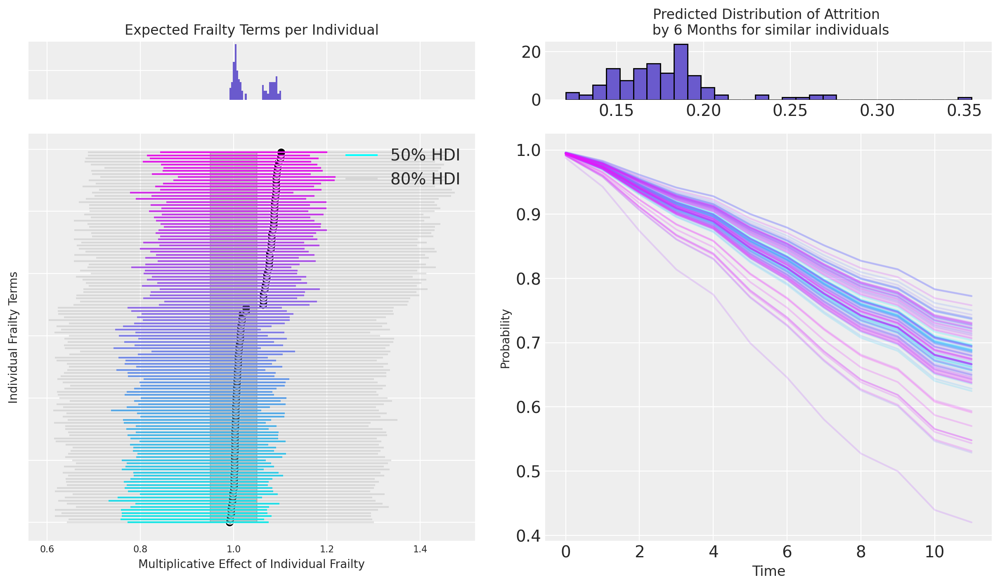

In [891]:
cm_subsection = np.linspace(0, 1, 120) 
colors = [cm.cool(x) for x in cm_subsection]

fig = plt.figure(figsize=(12, 7))
gs = fig.add_gridspec(
    2,
    2,
    height_ratios=(1, 7),
    left=0.1,
    right=0.9,
    bottom=0.1,
    top=0.9,
    wspace=0.05,
    hspace=0.05,
)
# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax.set_yticklabels([])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histx.set_title("Expected Frailty Terms per Individual", fontsize=12)
ax_histx.hist(predicted, bins=30, color='slateblue')
ax_histx.set_yticklabels([])
ax_histx.tick_params(labelsize=8)
ax.set_ylabel("Individual Frailty Terms", fontsize=10)
ax.tick_params(labelsize=8)
ax.hlines(
    range(len(predicted)),
    hdi.sel(hdi='lower').to_array(),
    hdi.sel(hdi='higher').to_array(),
    color=colors,
    label='50% HDI'
)
ax.hlines(
    range(len(predicted)),
    hdi2.sel(hdi='lower').to_array(),
    hdi2.sel(hdi='higher').to_array(),
    color='grey',
    alpha=0.2, 
    label='80% HDI'
)
ax.scatter(predicted, range(len(predicted)), color="black", ec="white", s=60)
ax.set_xlabel("Multiplicative Effect of Individual Frailty", fontsize=10)
ax.legend()
ax.fill_betweenx(range(len(predicted)), 0.95, 1.05, alpha=0.4, color="grey");

ax1 = fig.add_subplot(gs[1, 1])
surv_frailty_df[list(predicted['frailty_id'].values)].plot(ax=ax1, legend=False, color=colors, alpha=0.2);
ax1_hist = fig.add_subplot(gs[0, 1])
ax1_hist.hist((1 - surv_frailty_df[list(predicted['frailty_id'].values)].iloc[6]), bins=30, color='slateblue', ec='black')
ax1.set_xlabel("Time", fontsize=12)
ax1_hist.set_title("Predicted Distribution of Attrition \n by 6 Months for similar individuals", fontsize=12);
ax1.set_ylabel('Probability', fontsize=10);


## Conclusion

## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/) in October 2023 

## References
:::{bibliography}
:filter: docname in docnames
:::

## Watermark

In [4]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Wed Jun 21 2023

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 8.11.0

pytensor: 2.11.1

numpy     : 1.23.5
matplotlib: 3.7.1
pandas    : 1.5.3
pymc      : 5.3.0
arviz     : 0.15.1

Watermark: 2.3.1



:::{include} ../page_footer.md
:::